In [32]:
import json
import requests
import os
import zipfile
import geopandas as gpd 
import pandas as pd
import contextily as cx
import numpy as np
import io
from pandas import json_normalize
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# CLUSTERING POR RESTAURANTES

El objetivo principal de este proyecto es lograr dar recomendaciones de posibles ubicaciones para abrir restaurantes de cierto giro.
El primer para conseguir esto es usar K-means para agrupar los AGEBs en clusters, utilizando datos de frecuencia de restaurantes. Estos clusters serviránpara identificar patrones y similitudes entre diferentes áreas en términos de la disponibilidad y variedad de restaurantes.

In [18]:
#leemos el archicvo shape de los agebs de Nuevo León
gdf = gpd.read_file("FASE_2/DF_FINAL.shp/DF_FINAL.shp").to_crs(4326)

In [33]:
gdf.head()

,CVEMA,MUN,NOM_MUN,AGEB,P12A14NOA,P15YM_AN,P18YM_PB,P6A11_NOAM,POBTOT,PSINDER,...,VPH_REFRI,VPH_TELEF,Rest_Carta,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar,geometry
0,0061882,6,Apodaca,1882,10,67,3404,0,10712,2186,...,2786,1874,0,2,0,3,3,1,3,"POLYGON ((-100.15091 25.71505, -100.15099 25.7..."
1,0061435,6,Apodaca,1435,5,16,4582,4,9224,1185,...,2538,1712,0,0,0,1,1,3,0,"POLYGON ((-100.16946 25.75323, -100.16861 25.7..."
2,0061647,6,Apodaca,1647,3,6,2822,0,4650,638,...,1404,1128,0,0,0,2,1,0,0,"POLYGON ((-100.23345 25.77729, -100.23349 25.7..."
3,0060969,6,Apodaca,0969,0,0,0,0,0,0,...,0,0,8,2,1,3,3,6,0,"POLYGON ((-100.18562 25.77552, -100.18542 25.7..."
4,006030A,6,Apodaca,030A,10,15,2860,7,8268,1230,...,2168,1343,0,1,0,1,0,0,0,"POLYGON ((-100.16562 25.73954, -100.16554 25.7..."


In [20]:
nuevos_nombres = {'Restaurant': 'Rest_Carta',
                  'Restaura_1': 'Rest_Antojitos',
                  'Restaura_2': 'Rest_Mariscos',
                  'Restaura_3': 'Rest_Rapida',
                  'Restaura_4': 'Rest_TacosTortas',
                  'Restaura_5': 'Rest_Autoserv',
                  'Restaura_6': 'Rest_OtrosLlevar',
                  }

gdf.rename(columns=nuevos_nombres, inplace=True)
gdf.head()


,CVEMA,MUN,NOM_MUN,AGEB,P12A14NOA,P15YM_AN,P18YM_PB,P6A11_NOAM,POBTOT,PSINDER,...,VPH_REFRI,VPH_TELEF,Rest_Carta,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar,geometry
0,0061882,6,Apodaca,1882,10,67,3404,0,10712,2186,...,2786,1874,0,2,0,3,3,1,3,"POLYGON ((-100.15091 25.71505, -100.15099 25.7..."
1,0061435,6,Apodaca,1435,5,16,4582,4,9224,1185,...,2538,1712,0,0,0,1,1,3,0,"POLYGON ((-100.16946 25.75323, -100.16861 25.7..."
2,0061647,6,Apodaca,1647,3,6,2822,0,4650,638,...,1404,1128,0,0,0,2,1,0,0,"POLYGON ((-100.23345 25.77729, -100.23349 25.7..."
3,0060969,6,Apodaca,0969,0,0,0,0,0,0,...,0,0,8,2,1,3,3,6,0,"POLYGON ((-100.18562 25.77552, -100.18542 25.7..."
4,006030A,6,Apodaca,030A,10,15,2860,7,8268,1230,...,2168,1343,0,1,0,1,0,0,0,"POLYGON ((-100.16562 25.73954, -100.16554 25.7..."


In [21]:
# columnas relevantes para el clustering
columnas_clustering = ['Rest_Carta',
                       'Rest_Antojitos',
                       'Rest_Mariscos',
                       'Rest_Rapida',
                       'Rest_TacosTortas',
                       'Rest_Autoserv',
                       'Rest_OtrosLlevar',
                       'POBTOT'
                       ]

# creo dataframe solo con las colmnas seleccionadas
datos_clustering = gdf[columnas_clustering]


In [31]:
datos_clustering.head(10)

,Rest_Carta,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar,POBTOT
0,0,2,0,3,3,1,3,10712
1,0,0,0,1,1,3,0,9224
2,0,0,0,2,1,0,0,4650
3,8,2,1,3,3,6,0,0
4,0,1,0,1,0,0,0,8268
5,0,2,1,4,4,1,1,13304
6,0,3,1,2,6,0,0,11738
7,0,0,0,2,0,0,0,3844
8,0,0,0,0,1,0,0,2426
9,0,0,0,2,0,0,0,2016


Debido a que las variables de frecuencia de restaurantes pueden tener diferentes escalas y magnitudes, la normalización garantiza que todas las variables contribuyan equitativamente al cálculo de la distancia entre puntos. Es por esto ue se normalizan los datos para entrenar el modelo:

In [27]:
# Normalizamos los datos
scaler = StandardScaler()
datos_normalizados = scaler.fit_transform(datos_clustering)

In [28]:
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import GridSearchCV

import warnings

# Ignorar todas las advertencias
warnings.filterwarnings("ignore")

def gmm_bic_score(estimator, datos_normalizados):
    #Callable to pass to GridSearchCV that will use the BIC score."""
    # Make it negative since GridSearchCV expects a score to maximize
    return -estimator.bic(datos_normalizados)
    
# Definir los parámetros que deseas buscar
param_grid = {
    'n_components': [2, 3, 4, 5, 6, 7],  # Número de componentes para probar
    'covariance_type': ['full', 'tied', 'diag', 'spherical']  # Tipo de covarianza para probar
}

# Crear una instancia del modelo GMM
gmm = GaussianMixture()

# Crear una instancia de GridSearchCV
grid_search = GridSearchCV(gmm, param_grid=param_grid, cv=5, scoring=gmm_bic_score)  # Especifica el número de divisiones para la validación cruzada

# Realizar la búsqueda en cuadrícula
grid_search.fit(datos_normalizados)

# Imprimir los mejores hiperparámetros encontrados
print("Mejores hiperparámetros:", grid_search.best_params_)

Mejores hiperparámetros: {'covariance_type': 'diag', 'n_components': 7}


In [29]:
import pandas as pd

df = pd.DataFrame(grid_search.cv_results_)[
    ["param_n_components", "param_covariance_type", "mean_test_score"]
]
df["mean_test_score"] = -df["mean_test_score"]
df = df.rename(
    columns={
        "param_n_components": "Number of components",
        "param_covariance_type": "Type of covariance",
        "mean_test_score": "BIC score",
    }
)
df.sort_values(by="BIC score").head()

,Number of components,Type of covariance,BIC score
17,7,diag,1491.603805
16,6,diag,1840.195207
14,4,diag,2120.877108
3,5,full,2172.272724
5,7,full,2186.840292


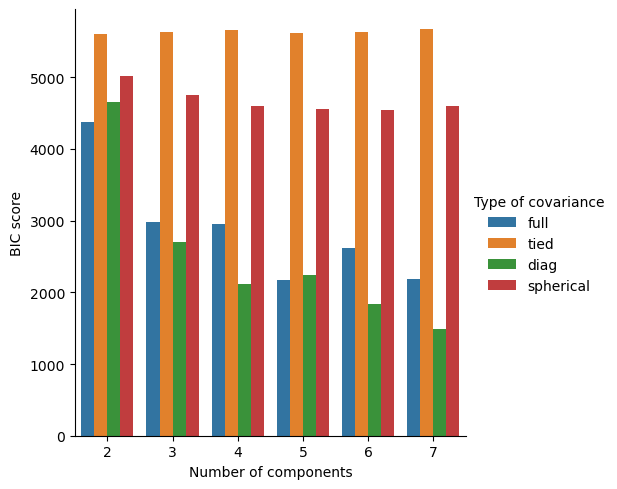

In [30]:
import seaborn as sns

sns.catplot(
    data=df,
    kind="bar",
    x="Number of components",
    y="BIC score",
    hue="Type of covariance",
)
plt.show()

In [100]:
# número de clusters
num_clusters = 7
# se crea el modelo de GaussianMixture y se entrena el modelo
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=num_clusters, covariance_type = 'diag')
gmm.fit(datos_normalizados)

GaussianMixture(covariance_type='diag', n_components=7)

In [101]:
# Predecir a qué cluster pertenece cada instancia de datos
labels = gmm.predict(datos_normalizados)

# Agregar las etiquetas de clustering al DataFrame original
gdf['Cluster'] = labels

# Distribución de los clusters
print(gdf['Cluster'].value_counts())

Cluster
4    718
1    186
2    148
0    148
5     83
3      3
6      1
Name: count, dtype: int64


In [102]:
import matplotlib.pyplot as plt

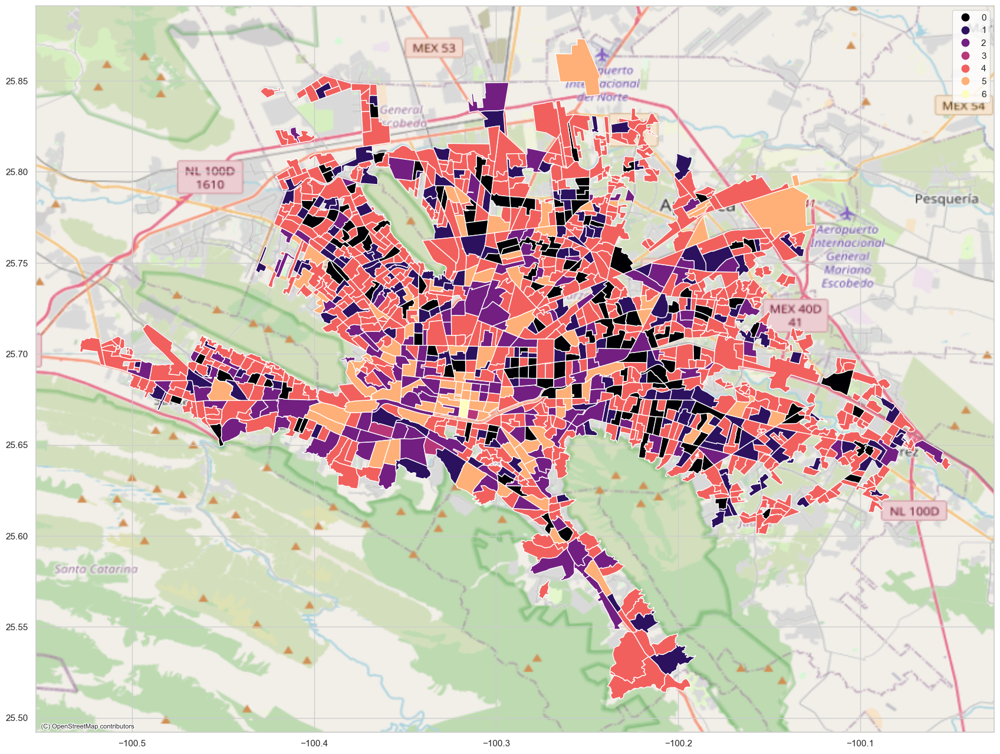

In [103]:
#mostrar clusters en el mapa
ax = gdf.plot("Cluster", cmap="magma", legend=True, figsize=(28, 16), categorical =True)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

In [104]:
# se seleccionan las columnas numéricas relevantes para el clustering
columnas_numericas = gdf.select_dtypes(include=np.number).columns.tolist()
columnas_numericas.remove('Cluster')

# se calcula el promedio de cada variable numérica para cada cluster
medias_por_cluster = gdf.groupby('Cluster')[columnas_numericas].mean()

# solo las columnas de restaurantes
columnas_restaurantes = [
    'Rest_Carta',
    'Rest_Antojitos',
    'Rest_Mariscos',
    'Rest_Rapida',
    'Rest_TacosTortas',
    'Rest_Autoserv',
    'Rest_OtrosLlevar',
]

medias_restaurantes_por_cluster = medias_por_cluster[columnas_restaurantes]

# Muestra las medias de frecuencia de restaurantes por cluster
medias_restaurantes_por_cluster

,Rest_Carta,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar
Cluster,,,,,,,
0,1.168919,3.121622,1.277027,4.087838,7.641892,0.527027,0.777027
1,0.258065,0.940860,0.768817,1.446237,2.795699,0.430108,0.182796
2,3.858108,1.135135,0.472973,1.628378,3.405405,1.472973,0.837838
3,48.333333,6.333333,3.000000,5.666667,18.666667,11.000000,5.000000
4,0.552925,1.108635,0.000000,1.580780,2.820334,0.000000,0.356546
5,9.951807,3.409639,1.759036,3.313253,8.397590,3.349398,1.975904
6,41.000000,14.000000,9.000000,12.000000,35.000000,10.000000,30.000000


In [105]:
medias_restaurantes_por_cluster.reset_index(inplace=True)
medias_restaurantes_melted = pd.melt(medias_restaurantes_por_cluster, id_vars=['Cluster'], var_name='Tipo de Restaurante', value_name='Frecuencia Promedio')

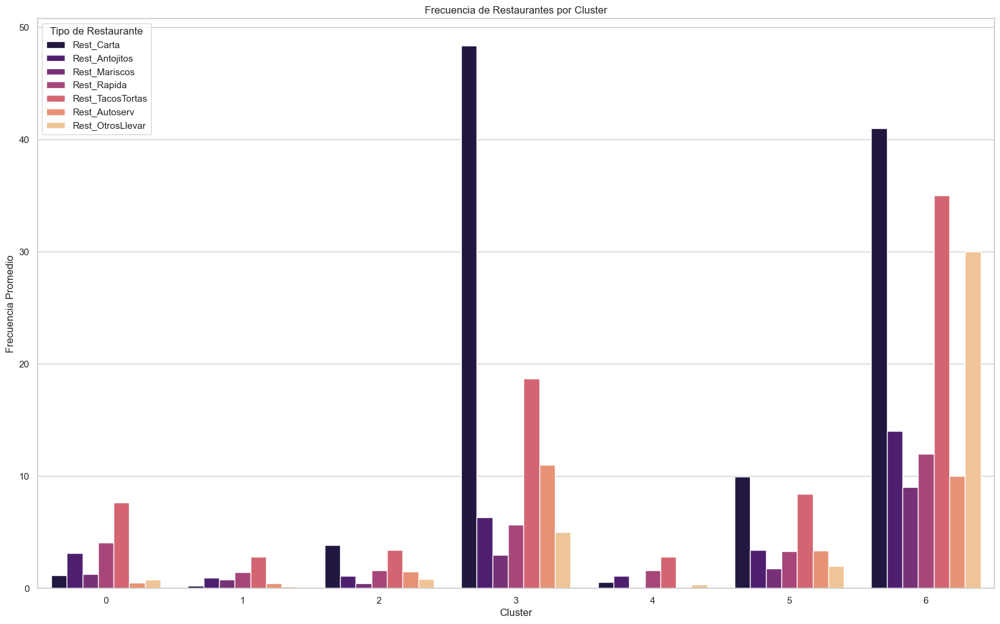

In [106]:
import seaborn as sns

# Configuración de estilo de Seaborn
sns.set(style="whitegrid")

# Gráfico de barras para las medias de frecuencia de restaurantes por cluster
plt.figure(figsize=(20, 12))
sns.barplot(data=medias_restaurantes_melted,
            x='Cluster', y='Frecuencia Promedio', hue='Tipo de Restaurante', palette='magma')
plt.title('Frecuencia de Restaurantes por Cluster')
plt.xlabel('Cluster')
plt.ylabel('Frecuencia Promedio')
plt.legend(title='Tipo de Restaurante')
plt.xticks(rotation=0)  # Rotar etiquetas del eje x
plt.show()

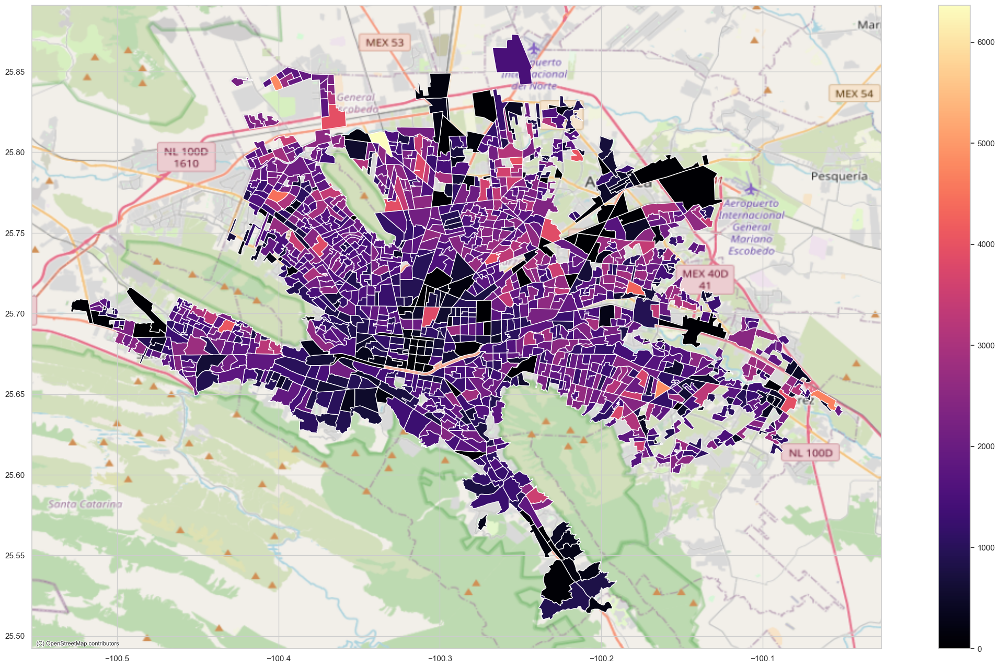

In [107]:
#mostrar clusters en el mapa
ax = gdf.plot("VIVPAR_HAB", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

In [108]:
gdf.columns

Index(['CVEMA', 'MUN', 'NOM_MUN', 'AGEB', 'P12A14NOA', 'P15YM_AN', 'P18YM_PB',
       'P6A11_NOAM', 'POBTOT', 'PSINDER', 'VIVPAR_HAB', 'VPH_EXCSA',
       'VPH_LAVAD', 'VPH_NDEAED', 'VPH_PISOTI', 'VPH_REFRI', 'VPH_TELEF',
       'Rest_Carta', 'Rest_Antojitos', 'Rest_Mariscos', 'Rest_Rapida',
       'Rest_TacosTortas', 'Rest_Autoserv', 'Rest_OtrosLlevar', 'geometry',
       'Cluster', 'Tot_Rest', 'POBREST'],
      dtype='object')

# CALCULANDO POBLACIÓN POR RESTAURANTE

In [109]:
total_restaurantes = ['Rest_Carta',
                       'Rest_Antojitos',
                       'Rest_Mariscos',
                       'Rest_Rapida',
                       'Rest_TacosTortas',
                       'Rest_Autoserv',
                       'Rest_OtrosLlevar',
                       ]

gdf['Tot_Rest'] = gdf[total_restaurantes].sum(axis=1)

## Relación Personas por Restaurante

In [110]:
gdf['POBREST'] = gdf['POBTOT'] / gdf['Tot_Rest'] 
gdf.head()

,CVEMA,MUN,NOM_MUN,AGEB,P12A14NOA,P15YM_AN,P18YM_PB,P6A11_NOAM,POBTOT,PSINDER,...,Rest_Antojitos,Rest_Mariscos,Rest_Rapida,Rest_TacosTortas,Rest_Autoserv,Rest_OtrosLlevar,geometry,Cluster,Tot_Rest,POBREST
0,0061882,6,Apodaca,1882,10,67,3404,0,10712,2186,...,2,0,3,3,1,3,"POLYGON ((-100.15091 25.71505, -100.15099 25.7...",2,12,892.666667
1,0061435,6,Apodaca,1435,5,16,4582,4,9224,1185,...,0,0,1,1,3,0,"POLYGON ((-100.16946 25.75323, -100.16861 25.7...",2,5,1844.800000
2,0061647,6,Apodaca,1647,3,6,2822,0,4650,638,...,0,0,2,1,0,0,"POLYGON ((-100.23345 25.77729, -100.23349 25.7...",4,3,1550.000000
3,0060969,6,Apodaca,0969,0,0,0,0,0,0,...,2,1,3,3,6,0,"POLYGON ((-100.18562 25.77552, -100.18542 25.7...",5,23,0.000000
4,006030A,6,Apodaca,030A,10,15,2860,7,8268,1230,...,1,0,1,0,0,0,"POLYGON ((-100.16562 25.73954, -100.16554 25.7...",4,2,4134.000000


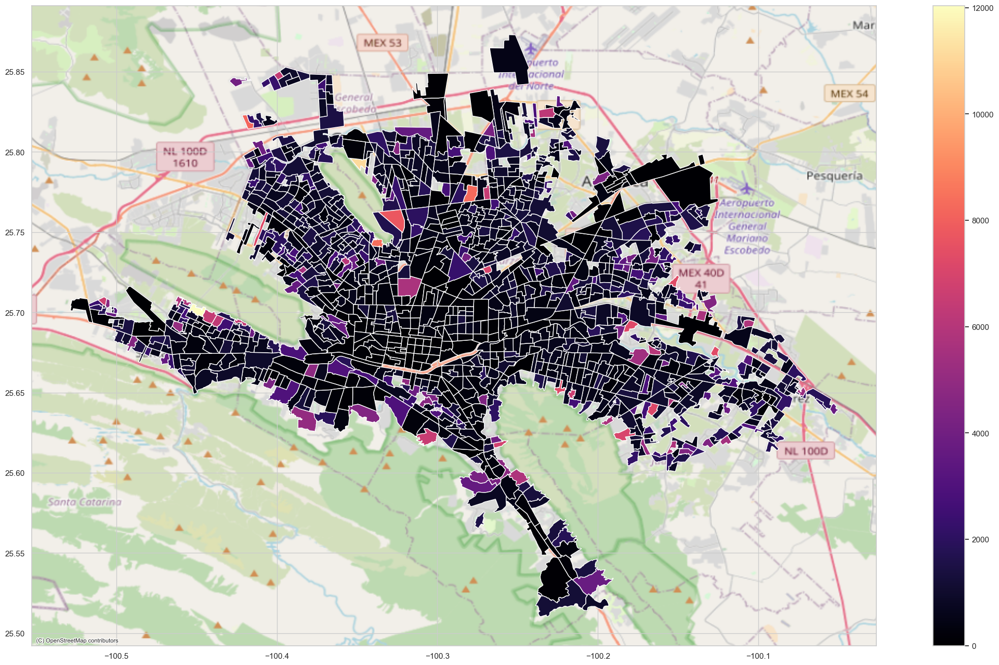

In [111]:
#mostrar Personas por restaurante
ax = gdf.plot("POBREST", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

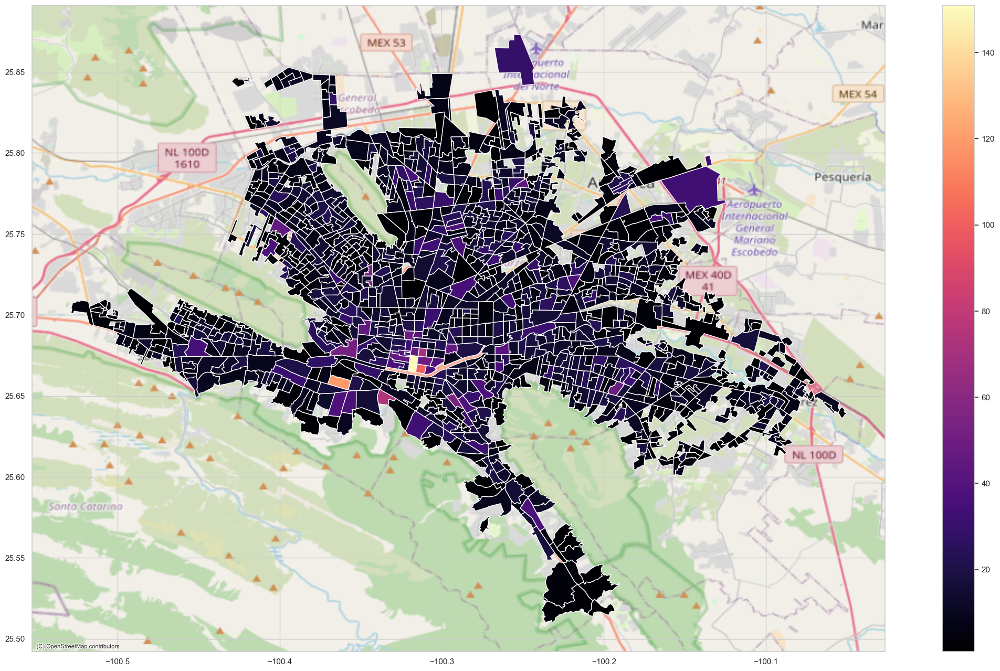

In [112]:
#mostrar Total de restaurante
ax = gdf.plot("Tot_Rest", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

In [113]:
gdf[['Tot_Rest','POBREST','POBTOT']].describe()

,Tot_Rest,POBREST,POBTOT
count,1287.000000,1287.000000,1287.000000
mean,10.599068,1169.735322,5900.272727
std,10.603233,1395.272537,3241.195867
min,1.000000,0.000000,0.000000
25%,4.000000,364.357143,3731.000000
50%,8.000000,691.200000,5808.000000
75%,14.000000,1373.321429,7866.000000
max,151.000000,12038.000000,22586.000000


## OUTLIERS 

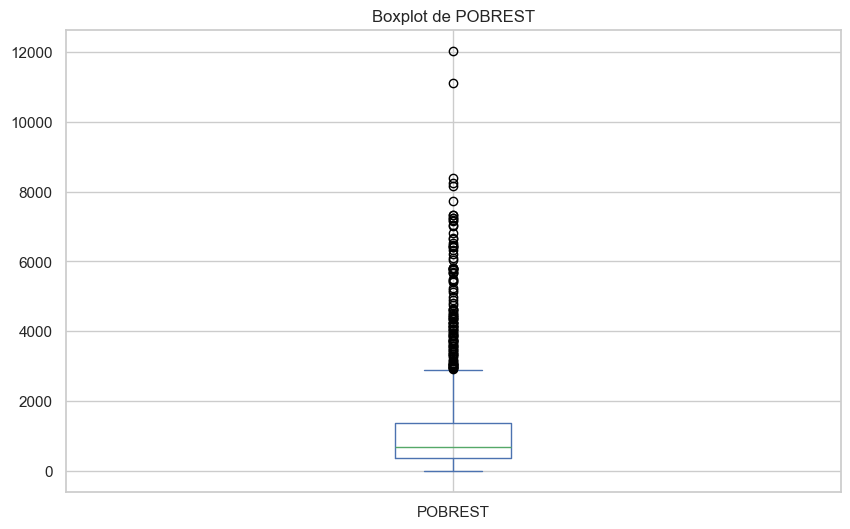

In [114]:
plt.figure(figsize=(10, 6))
gdf['POBREST'].plot(kind='box')
plt.title(f"Boxplot de {'POBREST'}")
plt.show()

A partir de este boxblot nos damos cuenta de que existen outliers que generan mucho ruido, por lo tanto nos quedaremos unicamente con el rango del 25% al 75%

In [115]:
# Calcular la media y la desviación estándar de la columna
mean = gdf['POBREST'].mean()
std_dev = gdf['POBREST'].std()

# Definir un límite (por ejemplo, 3 desviaciones estándar)
cut_off = std_dev * 3
lower, upper = mean - cut_off, mean + cut_off

# Eliminar outliers
gdf_sin_outliers = gdf[(gdf['POBREST'] > 364.357143) & (gdf['POBREST'] < 1373.321429)]

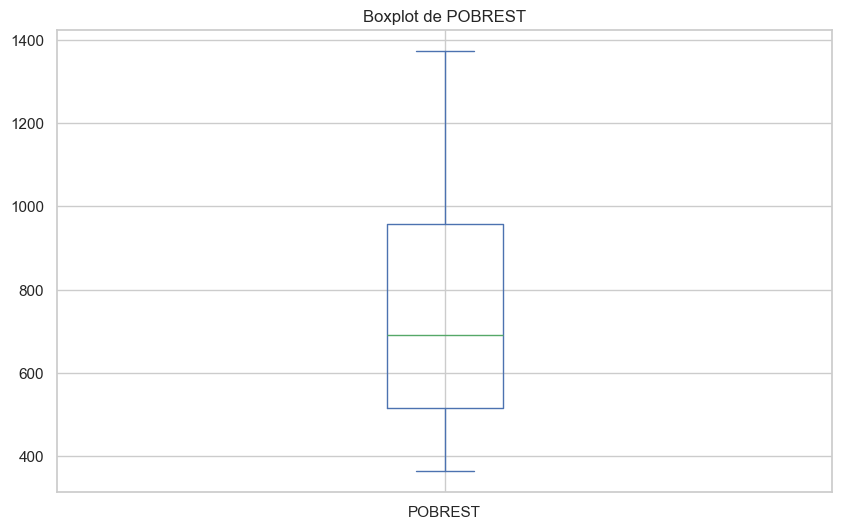

In [116]:
plt.figure(figsize=(10, 6))
gdf_sin_outliers['POBREST'].plot(kind='box')
plt.title(f"Boxplot de {'POBREST'}")
plt.show()

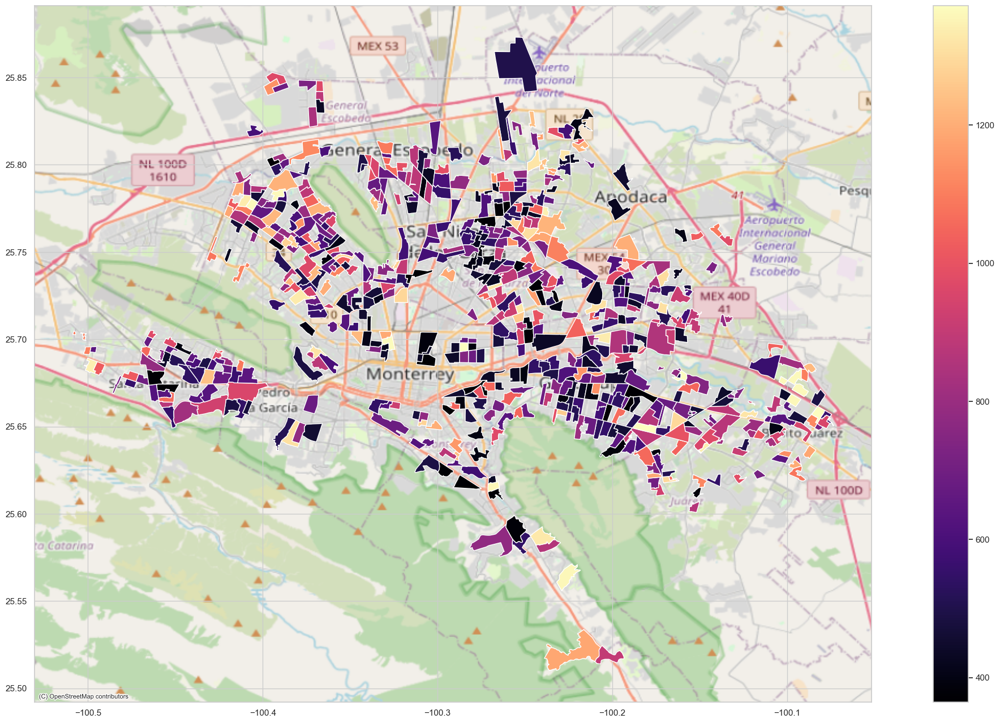

In [117]:
#mostrar Relación Pob Rest eliminando los outliers
ax = gdf_sin_outliers.plot("POBREST", cmap="magma", legend=True, figsize=(28, 16))
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)

In [118]:
#conteo de clusters después de filtrar 
gdf_sin_outliers['Cluster'].value_counts()

Cluster
4    352
1    126
0     96
2     62
5      7
Name: count, dtype: int64

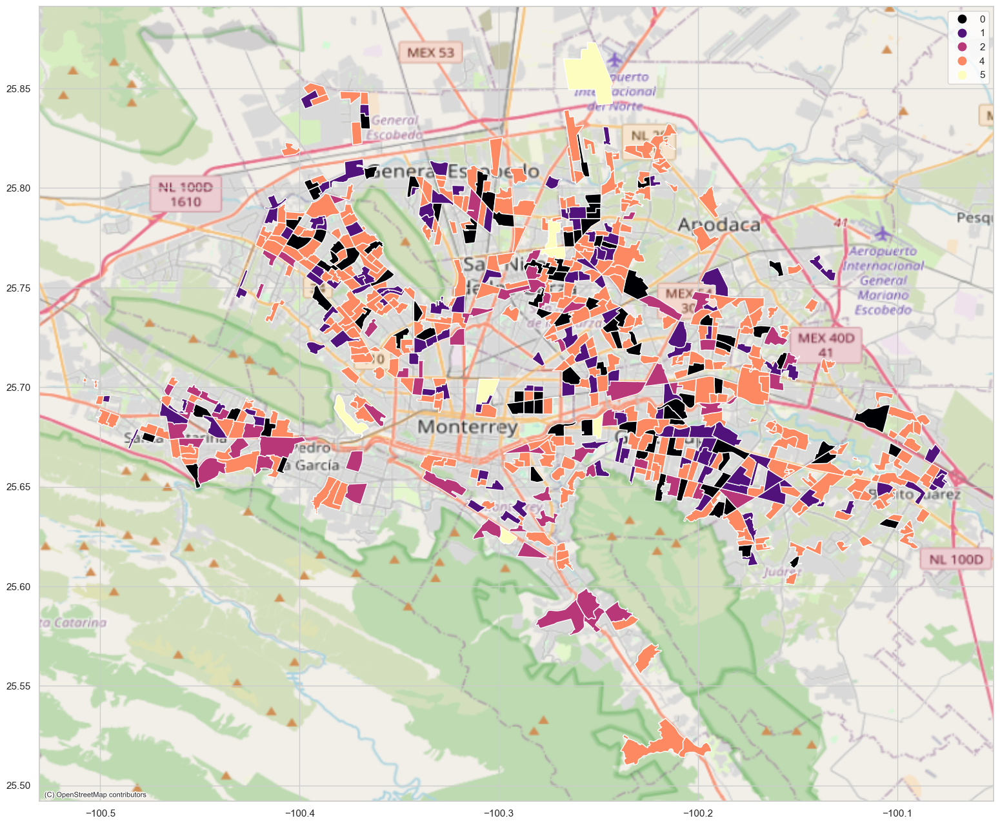

In [119]:
#mostrar Relación Pob Rest eliminando los outliers
ax = gdf_sin_outliers.plot("Cluster", cmap="magma", legend=True, figsize=(28, 16),categorical =True)
cx.add_basemap(ax, crs=gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik)